# About Dataset

**Context**
<br>
Music. Experts have been trying for a long time to understand sound and what differenciates one song from another. How to visualize sound. What makes a tone different from another.

**Content**
<br>
genres original - A collection of 10 genres with 100 audio files each, all having a length of 30 seconds (the famous GTZAN dataset, the MNIST of sounds)

Genres included in the dataset:



*   Blues
*   Classical
*   Country
*   Disco
*   Hip Hop
*   Jazz
*   Metal
*   Pop
*   Reggae
*   Rock








# Import Library

In [164]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import IPython
import warnings
import time
import joblib

# Audio processing library
import librosa
import librosa.display

# Machine learning preprocessing and model selection
import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import confusion_matrix, classification_report

from tqdm import tqdm

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=UserWarning)

sns.set(style="whitegrid")
from google.colab import files

# Define Path

In [165]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [166]:
BASE_PATH = "/content/drive/MyDrive/CODE_FOR_LIFE/Deep Learning/music_classification/"
DATASET_PATH = BASE_PATH + "dataset/"
MODELS_PATH = BASE_PATH + "models/"

In [167]:
!ls "/content/drive/MyDrive/CODE_FOR_LIFE/Deep Learning/music_classification/dataset/genres_original/"

blues  classical  country  disco  hiphop  jazz	metal  pop  reggae  rock


In [168]:
def count_files(folder_path):
    count = 0
    for root, dirs, files in os.walk(folder_path):
        count += len(files)
    return count

In [169]:
print("JUMLAH DATA PER KELAS - DATA ORIGINAL")
for i in os.listdir(DATASET_PATH + "genres_original/"):
    print(f"Jumlah Data {i}: ", count_files(DATASET_PATH + "genres_original/" + i))

JUMLAH DATA PER KELAS - DATA ORIGINAL
Jumlah Data blues:  100
Jumlah Data country:  100
Jumlah Data hiphop:  100
Jumlah Data rock:  100
Jumlah Data disco:  100
Jumlah Data reggae:  100
Jumlah Data metal:  100
Jumlah Data pop:  100
Jumlah Data classical:  100
Jumlah Data jazz:  99


In [170]:
print("JUMLAH DATA PER KELAS - DATA YOUTUBE")
for i in os.listdir(DATASET_PATH + "dataset_ytb/"):
    print(f"Jumlah Data {i}: ", count_files(DATASET_PATH + "dataset_ytb/" + i))

JUMLAH DATA PER KELAS - DATA YOUTUBE
Jumlah Data pop genre:  30
Jumlah Data hiphop genre:  30
Jumlah Data classical genre:  30
Jumlah Data disco genre:  30
Jumlah Data rock genre:  30
Jumlah Data jazz genre:  30
Jumlah Data blues genre:  30
Jumlah Data metal genre:  30
Jumlah Data country genre:  30
Jumlah Data reggae genre:  30


# Sample Audio Visualizing

In [171]:
genre_dict = {"blues":0, "classical":1, "country":2, "disco":3, "hiphop":4, "jazz":5, "metal":6, "pop":7, "reggae":8, "rock":9}

for genre in genre_dict.keys():
    print(genre)
    data, sampling_rate = librosa.load(DATASET_PATH + "genres_original/" + genre + "/" + genre + ".00000.wav")
    display(IPython.display.Audio(data, rate = sampling_rate))

Output hidden; open in https://colab.research.google.com to view.

## Waveform Plot of Music Sample

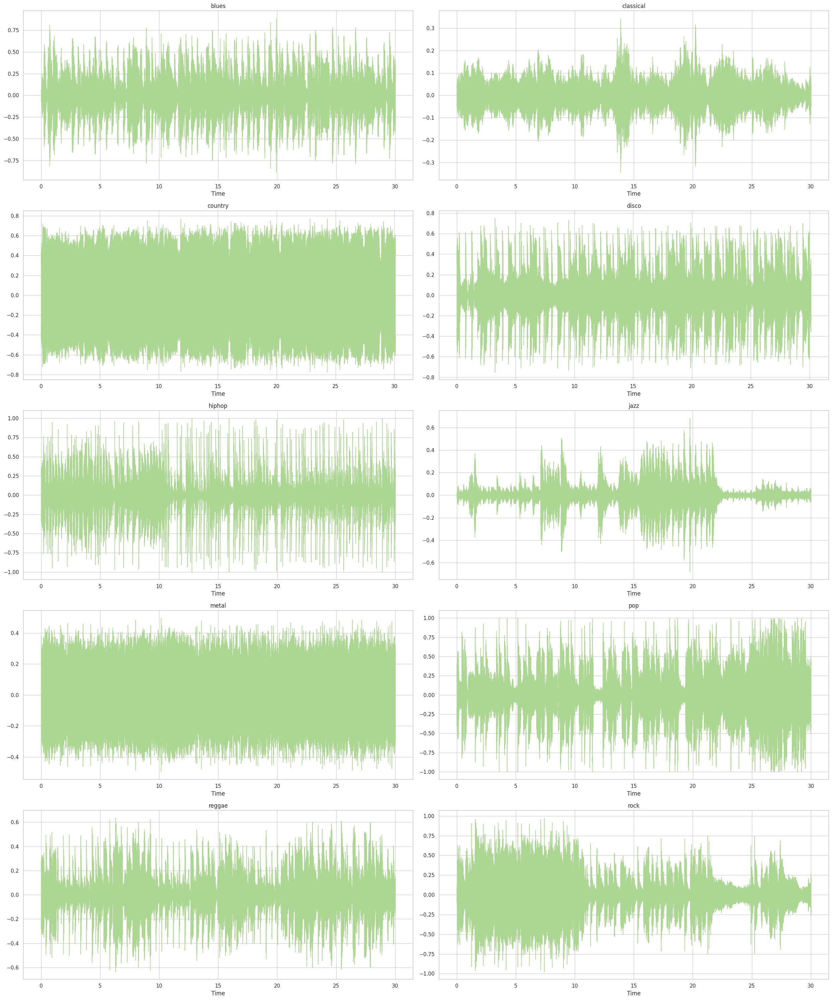

In [172]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(25, 30))
i = 0
j = 0

for genre in genre_dict.keys():
    data,sampling_rate = librosa.load(DATASET_PATH + "genres_original/" + genre + "/" + genre + ".00000.wav")
    librosa.display.waveshow(y = data, sr = sampling_rate, color = "#ACD793", ax=axes[i][j])

    axes[i][j].set_title(genre)
    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

# Features Extraction Sample Audio

Ekstraksi fitur bertujuan untuk mengkarakterisasi sinyal analog dalam hal ini adalah sinyal audio. Proses ini
mengolah fitur-fitur dari lagu yaitu:
* Mel Frequency Cepstrum Coeffciets
* Chroma Short-Time Fourier Transform
* Chroma Constant-Q Transform
* Spectral Bandwith
* Spectral Rollof
* Spectral Contrast
<br>
untuk digunakan sebagai data untuk mendukung proses klasifikasi.

In [10]:
sample_file = DATASET_PATH + "genres_original/blues/blues.00000.wav"
audio_sample, sr_sample = librosa.load(sample_file)

## Mel Frequency Cepstral Coefficients

MFCC (Mel-Frequency Cepstral Coefficients) adalah representasi dari koefisien Mel-frequency cepstrum dari sebuah sinyal audio. MFCC digunakan secara luas dalam pemrosesan sinyal suara dan pengenalan suara karena kemampuannya untuk mewakili karakteristik timbre suara manusia. MFCC sangat efektif karena mengompresi informasi penting dari sinyal suara menjadi sejumlah kecil koefisien yang masih mempertahankan karakteristik penting untuk pengenalan pola suara.

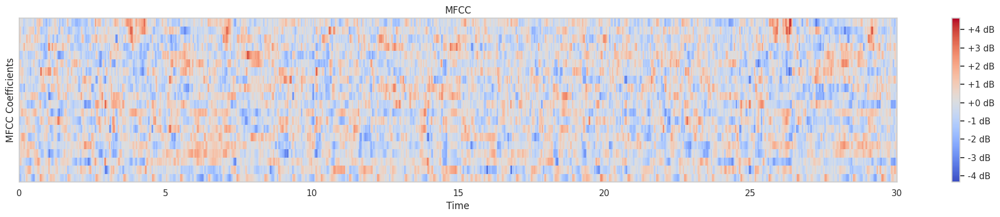

In [174]:
mfccs_1 = librosa.feature.mfcc(y=audio_sample, sr=sr_sample)
mfccs_1 = sklearn.preprocessing.scale(mfccs, axis=1)

plt.figure(figsize=(20, 4))
librosa.display.specshow(mfccs, x_axis='time', cmap='coolwarm')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCC')
plt.xlabel('Time')
plt.ylabel('MFCC Coefficients')
plt.tight_layout()

plt.show()

## Chroma STFT (Short-Time Fourier Transform)

Chroma STFT adalah metode untuk mengekstrak fitur chroma dari sinyal audio menggunakan transformasi Fourier jangka pendek. Tujuan dari Chroma STFT adalah untuk mendapatkan representasi kompak dari spektrum audio yang menekankan informasi tonal atau pitch yang relevan, terlepas dari oktaf.

In [175]:
chroma_stft_3 = librosa.feature.chroma_stft(y=audio_sample, sr=sr_sample)
cs_mean = np.mean(chroma_stft_3)
cs_var = np.var(chroma_stft_3)

print(cs_mean)
print(cs_var)

0.3501285
0.08877166


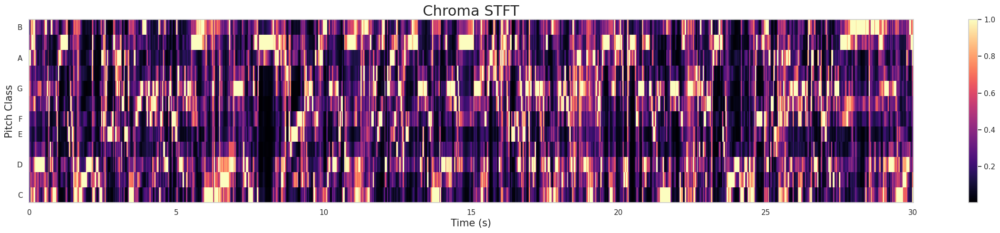

In [177]:
plt.figure(figsize=(30, 5))

librosa.display.specshow(chroma_stft_3, x_axis='time', y_axis='chroma', sr=sr_sample)
plt.colorbar()
plt.xlabel('Time (s)', fontsize=15)
plt.ylabel('Pitch Class', fontsize=15)
plt.title('Chroma STFT', fontsize=22)

plt.show()

## Chroma Constant-Q Transform

Chroma features adalah representasi dari energi spektral yang diringkas menjadi 12 nilai yang sesuai dengan 12 pitch classes dari musik (C, C#, D, D#, E, F, F#, G, G#, A, A#, B)

In [181]:
chroma_cqt_1 = librosa.feature.chroma_cqt(y=audio_sample, sr=sr_sample)

print("Rata-rata Chroma CQT: ", np.mean(chroma_cqt_1))
print("Variansi Chroma CQT: ", np.var(chroma_cqt_1))

Rata-rata Chroma CQT:  0.5378252
Variansi Chroma CQT:  0.053587057


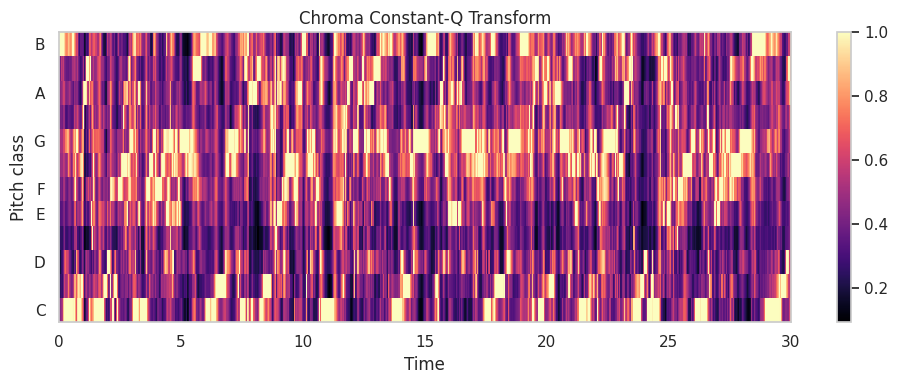

In [182]:
cqt = librosa.cqt(audio_sample, sr=sr_sample)
chroma_cqt_2 = librosa.feature.chroma_cqt(C=cqt, sr=sr_sample)

plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_cqt_1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chroma Constant-Q Transform')
plt.tight_layout()
plt.show()

## Spectral Bandwith

Spectral bandwidth adalah ukuran dari distribusi energi spektral dalam sinyal audio, mengindikasikan seberapa lebar atau sempit spektrum frekuensi dari sinyal tersebut. Spectral bandwidth dapat memberikan informasi penting tentang karakteristik timbre atau warna suara dalam sinyal audio, seperti apakah suara tersebut tajam dan bernada tinggi atau lembut dan bernada rendah.



In [183]:
spectral_bandwidth = librosa.feature.spectral_bandwidth(y=audio_sample, sr=sr_sample)
spectral_bandwidths_mean = spectral_bandwidth.mean()

print("Rata-rata Spectral Bandwith: ", np.mean(spectral_bandwidth))
print("Variansi Spectral Bandwith: ", np.var(spectral_bandwidth))

Rata-rata Spectral Bandwith:  2002.4124072733878
Variansi Spectral Bandwith:  85834.41040579003


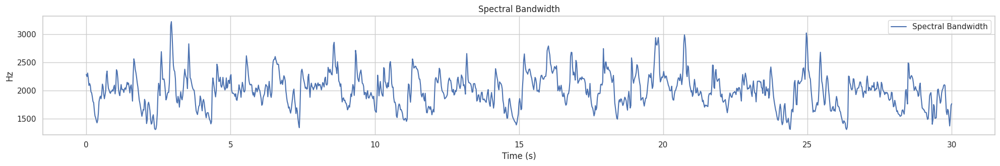

In [184]:
plt.figure(figsize=(20, 6))

plt.subplot(2, 1, 2)
times = librosa.times_like(spectral_bandwidths)
plt.plot(times, spectral_bandwidths[0], label='Spectral Bandwidth')
plt.xlabel('Time (s)')
plt.ylabel('Hz')
plt.title('Spectral Bandwidth')
plt.legend()

plt.tight_layout()
plt.show()

## Spectral Rollof
Spectral roll-off adalah fitur dalam analisis spektrum audio yang mengindikasikan frekuensi di mana sebagian besar (biasanya 85-95%) dari total energi spektral terkonsentrasi di bawahnya. Ini adalah ukuran penting dalam analisis audio, terutama dalam pemrosesan musik dan pengenalan pola, karena membantu membedakan antara jenis suara atau instrumen yang berbeda berdasarkan distribusi energi frekuensi.

In [185]:
spectral_rolloff = librosa.feature.spectral_rolloff(y=audio_sample, sr=sr_sample)

display(np.var(spectral_rolloff))
display(spectral_rolloff.mean())

901252.916706492

3805.7230301080335

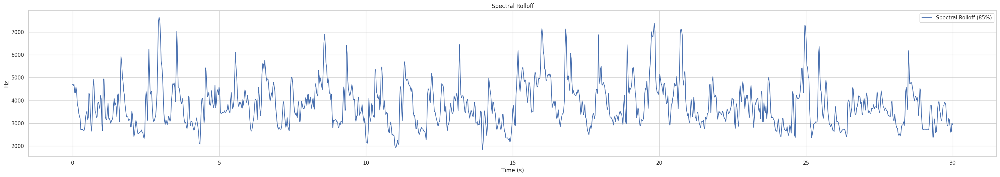

In [188]:
rolloff = librosa.feature.spectral_rolloff(y=audio_sample, sr=sr_sample, roll_percent=0.85)

plt.figure(figsize=(30, 10))

plt.subplot(2, 1, 2)
times = librosa.times_like(rolloff)
plt.plot(times, rolloff[0], label='Spectral Rolloff (85%)')
plt.xlabel('Time (s)')
plt.ylabel('Hz')
plt.title('Spectral Rolloff')
plt.legend()

plt.tight_layout()
plt.show()

## Spectral Contrast

In [190]:
spectral_contrast = librosa.feature.spectral_contrast(y=audio_sample, sr=sr_sample)

print(spectral_contrast.mean())
print(spectral_contrast.var())

20.52328909927147
76.80119101353483


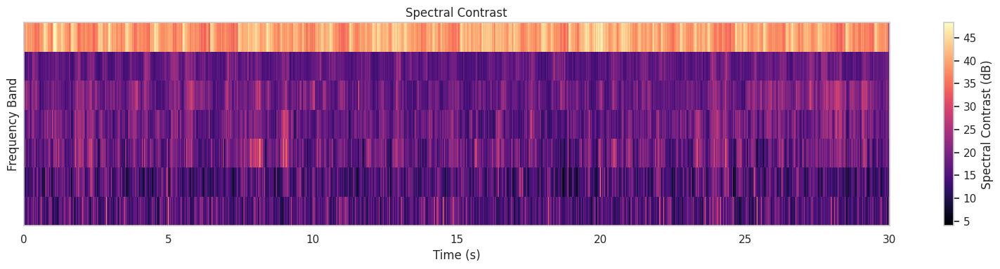

In [191]:
plt.figure(figsize=(16, 4))
librosa.display.specshow(spectral_contrast, x_axis='time', sr=sr_sample)
plt.colorbar(label='Spectral Contrast (dB)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency Band')
plt.title('Spectral Contrast')

plt.tight_layout()
plt.show()

# Features Extraction Full Audio

In [235]:
def extract_features(file_path):
    audio, sample_rate = librosa.load(file_path)

    # 1. Mel Frequency Cepstrum Coeffciets
    mfccs_features_1 = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs_features_1.T, axis=0)

    # 2. Chroma Short-Time Fourier Transform
    chroma_stft_1 = librosa.feature.chroma_stft(y=audio, sr=sample_rate)
    cs_mean = np.mean(chroma_stfts)
    cs_var = np.var(chroma_stfts)

    # 3. Chroma Constant-Q Transform (CQT)
    chroma_cqt_1 = librosa.feature.chroma_cqt(y=audio, sr=sample_rate)
    ccqt_mean = np.mean(chroma_cqt_1)
    ccqt_var = np.var(chroma_cqt_1)

    # 4. Spectral Bandwith
    spectral_bandwidth_1 = librosa.feature.spectral_bandwidth(y=audio, sr=sample_rate)
    sb_mean = np.mean(spectral_bandwidth_1)
    sb_var = np.var(spectral_bandwidth_1)

    # 5. Spectral Rollof
    spectral_rolloff_1 = librosa.feature.spectral_rolloff(y=audio, sr=sample_rate)
    spr_mean = np.mean(spectral_rolloff_1)
    spr_var = np.var(spectral_rolloff_1)

    # 6. Spectral Contrast
    spectral_contrast_1 = librosa.feature.spectral_contrast(y=audio, sr=sample_rate)
    sc_mean = spectral_contrast_1.mean()
    sc_var = spectral_contrast_1.var()

    time.sleep(0.1)
    return mfccs_scaled_features, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var

def split_mfccs_columns(df):
    for idx, row in df.iterrows():
        for i, val in enumerate(row['mfccs'], start=1):
            if i % 2 != 0:
                df.at[idx, f'mfcc_mean_{(i+1)//2}'] = val
            else:
                df.at[idx, f'mfcc_var_{i//2}'] = val

## Data Original

In [236]:
data_ori = DATASET_PATH + "genres_original/"
data_extract_ori = []

for genre in tqdm(os.listdir(data_ori), desc="Processing Data Original", unit=" data"):
    genre_folder = os.path.join(data_ori, genre)
    if os.path.isdir(genre_folder):
        for file_name in os.listdir(genre_folder):
            if file_name.endswith('.wav'):
                file_path = os.path.join(genre_folder, file_name)
                mfccs, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var = extract_features(file_path)
                data_extract_ori.append([file_name, mfccs, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var, genre])

df_ori = pd.DataFrame(data_extract_ori,
                      columns=['file_name',
                                'mfccs',
                                'chroma_stft_mean',
                                'chroma_stft_var',
                                'chroma_cqt_mean',
                                'chroma_cqt_var',
                                'spectral_bandwidth_mean',
                                'spectral_bandwidth_var',
                                'spectral_rolloff_mean',
                                'spectral_rolloff_var',
                                'spectral_contrast_mean',
                                'spectral_contrast_var',
                                'label'])

df_ori = df_ori.sort_values(by='file_name').reset_index(drop=True)
split_mfccs_columns(df_ori)
df_ori.drop('mfccs', axis=1, inplace=True)
df_ori.to_csv(BASE_PATH + "result_data/data_original.csv", index=False)

display(df_ori.head(3))

Processing Data Original: 100%|██████████| 10/10 [15:02<00:00, 90.24s/ data]


,file_name,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,...,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20
0,blues.00000.wav,0.350129,0.00387,0.537825,0.053587,2002.412407,85834.410406,3805.723030,9.012529e+05,20.523289,...,5.656073,-3.269008,-0.206064,-2.999698,4.476317,-0.476855,6.006285,-0.059690,-3.458585,-1.841832
1,blues.00001.wav,0.350129,0.00387,0.476772,0.057725,2038.987608,213905.103191,3550.713616,2.978311e+06,20.672486,...,0.836019,-3.743217,-4.099705,-2.451905,5.834807,3.544988,4.897320,-0.415597,-1.995414,-0.465218
2,blues.00002.wav,0.350129,0.00387,0.443705,0.058773,1747.754087,76295.413398,3042.410115,7.841309e+05,22.191292,...,-1.376481,-4.749632,-0.377516,0.493469,0.447271,-4.162672,-4.815749,-6.703234,-4.425334,-0.981519


## Data Youtube

In [229]:
data_ytb = DATASET_PATH + "dataset_ytb/"
data_extract_ytb = []

for genre in tqdm(os.listdir(data_ytb), desc="Processing Data Youtube", unit=" data"):
    genre_folder = os.path.join(data_ytb, genre)
    if os.path.isdir(genre_folder):
        for file_name in os.listdir(genre_folder):
            if file_name.endswith('.wav'):
                file_path = os.path.join(genre_folder, file_name)
                mfccs, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var = extract_features(file_path)
                data_extract_ytb.append([file_name, mfccs, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var, genre])

df_ytb = pd.DataFrame(data_extract_ytb,
                      columns=['file_name',
                                'mfccs',
                                'chroma_stft_mean',
                                'chroma_stft_var',
                                'chroma_cqt_mean',
                                'chroma_cqt_var',
                                'spectral_bandwidth_mean',
                                'spectral_bandwidth_var',
                                'spectral_rolloff_mean',
                                'spectral_rolloff_var',
                                'spectral_contrast_mean',
                                'spectral_contrast_var',
                                'label'])

df_ytb = df_ytb.sort_values(by='file_name').reset_index(drop=True)
split_mfccs_columns(df_ytb)
df_ytb.drop('mfccs', axis=1, inplace=True)
df_ytb.to_csv(BASE_PATH + "result_data/data_youtube.csv", index=False)

display(df_ytb.head(3))

Processing Data Youtube: 100%|██████████| 10/10 [04:54<00:00, 29.41s/ data]


,file_name,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,...,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20
0,0000 blues ytb.wav,0.350129,0.00387,0.451287,0.077494,1891.682827,244866.654121,3025.997018,1.966374e+06,24.851726,...,-2.553576,-6.493411,-3.780223,-3.644616,-1.959571,-5.681433,-7.337544,-4.532332,-1.198813,-0.534117
1,0000 classical ytb.wav,0.350129,0.00387,0.254945,0.087981,1394.232550,75473.010002,1801.989104,3.516037e+05,26.957075,...,2.632329,2.530961,-1.330200,-7.087152,-6.628794,3.367244,-0.184876,2.351960,1.947506,4.763731
2,0000 country ytb.wav,0.350129,0.00387,0.494916,0.059956,2579.972258,50358.975974,5437.692119,8.394839e+05,21.823304,...,-2.020905,-0.796354,-2.643488,-1.517128,-4.682680,-1.335762,-5.263922,-0.231984,-1.578858,0.562015


## Concatenate

In [241]:
df_concat = pd.concat([df_ori, df_ytb])
df_concat

,file_name,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,label,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20
0,blues.00000.wav,0.350129,0.00387,0.537825,0.053587,2002.412407,85834.410406,3805.723030,9.012529e+05,20.523289,76.801191,blues,-113.598824,121.570671,-19.162262,42.363941,-6.362266,18.621931,-13.699734,15.339802,-12.274305,10.970944,-8.326061,8.802088,-3.669941,5.744675,-5.162783,0.751706,-1.687854,-0.408730,-2.302677,1.222467,-3.532875,-1.139781,-4.282828,-4.226084,0.915187,0.914064,-5.761807,-3.932804,1.509435,2.698465,5.656073,-3.269008,-0.206064,-2.999698,4.476317,-0.476855,6.006285,-0.059690,-3.458585,-1.841832
1,blues.00001.wav,0.350129,0.00387,0.476772,0.057725,2038.987608,213905.103191,3550.713616,2.978311e+06,20.672486,67.861845,blues,-207.523834,123.985138,8.947019,35.867149,2.909595,21.519474,-8.556513,23.370676,-10.103608,11.899242,-5.558824,5.377876,-2.234492,4.220704,-6.010686,0.929294,-0.728403,0.296872,-0.282430,0.530644,-4.098784,-1.243186,-2.851357,-4.350195,3.275085,1.219573,-0.013766,-0.066608,3.979034,-0.457768,0.836019,-3.743217,-4.099705,-2.451905,5.834807,3.544988,4.897320,-0.415597,-1.995414,-0.465218
2,blues.00002.wav,0.350129,0.00387,0.443705,0.058773,1747.754087,76295.413398,3042.410115,7.841309e+05,22.191292,76.122598,blues,-90.757164,140.440872,-29.084547,31.686693,-13.976547,25.753752,-13.664990,11.634442,-11.778322,9.714756,-13.125314,5.791247,-8.901966,-1.080160,-9.226244,2.448304,-7.724839,-1.819024,-3.440457,-2.238127,-4.052338,-0.571423,-2.011837,-5.386335,-5.133531,-7.805535,-1.168784,-0.205967,1.396435,-3.001880,-1.376481,-4.749632,-0.377516,0.493469,0.447271,-4.162672,-4.815749,-6.703234,-4.425334,-0.981519
3,blues.00003.wav,0.350129,0.00387,0.316891,0.071228,1596.422564,166551.844243,2184.879029,1.493078e+06,21.423621,63.386763,blues,-199.575134,150.086105,5.663404,26.855282,1.770072,14.232647,-4.827846,9.286853,-0.756120,8.134435,-3.200026,6.078081,-2.478445,-1.081587,-2.874454,0.773994,-3.324069,0.636311,-0.615968,-3.405046,-1.496809,-0.054012,-1.861315,-4.709931,-3.926332,-6.649480,-2.897778,-3.225131,-0.272315,-3.817554,-2.821949,-4.204427,-2.702336,-3.845604,-2.524410,-4.935610,-5.954977,-6.616996,-6.396002,-1.501189
4,blues.00004.wav,0.350129,0.00387,0.497005,0.066045,1748.410758,88378.704478,3579.957471,1.572336e+06,21.459618,63.033892,blues,-160.354172,126.209480,-35.581394,22.139256,-32.473549,10.850702,-23.350071,0.493249,-11.796538,1.203519,-13.084959,-2.810499,-6.934471,-7.553875,-9.167669,-4.515863,-5.451786,-0.915952,-4.408018,-11.704385,-5.866304,-0.721432,0.955714,-1.218466,4.580540,0.301649,-1.280044,-4.486533,-0.410622,0.279264,8.481701,3.646146,-3.007674,-6.110803,-6.951970,-4.070553,-1.137216,-0.491605,-4.786619,-3.221128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,0029 jazz ytb.wav,0.350129,0.00387,0.412107,0.068361,1683.018818,135257.802886,1876.871984,7.429071e+05,22.957853,119.959384,jazz genre,-81.600174,156.619614,17.357782,31.567228,2.163747,7.400844,1.088501,-0.562433,-4.215766,6.521575,-1.879490,2.283730,-4.599555,-2.346450,0.172221,6.664866,0.585342,-0.063948,-7.343699,-0.241629,-2.298938,4.381245,-1.867655,0.748685,-6.433475,-2.818012,-3.054154,-0.083264,-4.181178,2.650867,5.279838,6.347916,-3.978682,-

In [242]:
df_concat.columns

Index(['file_name', 'chroma_stft_mean', 'chroma_stft_var', 'chroma_cqt_mean',
       'chroma_cqt_var', 'spectral_bandwidth_mean', 'spectral_bandwidth_var',
       'spectral_rolloff_mean', 'spectral_rolloff_var',
       'spectral_contrast_mean', 'spectral_contrast_var', 'label',
       'mfcc_mean_1', 'mfcc_var_1', 'mfcc_mean_2', 'mfcc_var_2', 'mfcc_mean_3',
       'mfcc_var_3', 'mfcc_mean_4', 'mfcc_var_4', 'mfcc_mean_5', 'mfcc_var_5',
       'mfcc_mean_6', 'mfcc_var_6', 'mfcc_mean_7', 'mfcc_var_7', 'mfcc_mean_8',
       'mfcc_var_8', 'mfcc_mean_9', 'mfcc_var_9', 'mfcc_mean_10',
       'mfcc_var_10', 'mfcc_mean_11', 'mfcc_var_11', 'mfcc_mean_12',
       'mfcc_var_12', 'mfcc_mean_13', 'mfcc_var_13', 'mfcc_mean_14',
       'mfcc_var_14', 'mfcc_mean_15', 'mfcc_var_15', 'mfcc_mean_16',
       'mfcc_var_16', 'mfcc_mean_17', 'mfcc_var_17', 'mfcc_mean_18',
       'mfcc_var_18', 'mfcc_mean_19', 'mfcc_var_19', 'mfcc_mean_20',
       'mfcc_var_20'],
      dtype='object')

In [243]:
df_concat.to_csv(BASE_PATH + "result_data/data_original_youtube.csv", index=False)

print("Data Saved!")

Data Saved!


# Load the Data

In [259]:
df_ori_ytb_ready = pd.read_csv(BASE_PATH + "result_data/data_original_youtube.csv")

df_ori_ytb_ready.sample(5)

,file_name,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,label,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20
602,metal.00003.wav,0.350129,0.00387,0.573414,0.044926,2205.750625,29364.401678,5234.808279,4.203714e+05,20.273637,103.128163,metal,-43.095963,75.372490,-47.823303,53.022266,-12.325954,36.862835,-8.285685,28.386372,-14.524615,22.091658,-7.344944,15.974339,-13.127130,12.259998,-10.446625,5.928271,-6.671972,5.281168,-2.326397,3.584342,-5.636620,0.988052,-6.280673,-1.637556,-5.713146,-2.274904,-1.348726,-0.288751,-1.076129,-2.070967,0.563093,0.462481,-0.749736,-1.382036,0.515490,-4.539210,-3.114099,-1.121462,0.156803,0.653161
186,classical.00086.wav,0.350129,0.00387,0.393179,0.072338,1495.051182,165492.551764,2496.302771,1.054227e+06,19.500609,18.518660,classical,-283.513428,159.561600,-29.515244,18.527405,-9.859647,-3.425657,-10.989010,-9.791544,-8.299520,-4.243693,-2.871725,-5.970813,-4.024108,-3.350324,-3.398157,-1.863113,-0.449089,1.901416,-0.113663,-2.810790,-4.253617,0.203495,2.155634,-0.396137,-3.836167,-4.744472,-5.828291,-4.816197,-1.145704,-2.257390,-2.590693,-2.245969,2.434848,0.201477,-0.001570,-1.990004,-3.299629,-4.858514,-4.520892,-3.823223
1182,0018 disco ytb.wav,0.350129,0.00387,0.578409,0.051691,2585.173605,151532.504506,5254.901558,2.411803e+06,22.665071,123.769903,disco genre,-25.668957,79.691360,-5.660384,18.565393,3.477955,7.492843,0.890822,3.916218,-4.939494,5.173855,-1.561697,6.414415,-0.416737,4.248381,-2.872754,-0.041021,-5.057501,-0.636026,-6.244813,-1.456455,-3.507260,0.349666,-3.010977,2.478959,-0.673865,1.088859,-1.945134,1.732126,-0.186366,-0.829683,-7.717431,-3.557264,-4.506789,0.430001,-2.726921,-2.271402,-5.702511,-1.608141,-0.913754,-1.358114
977,rock.00078.wav,0.350129,0.00387,0.423111,0.067405,2204.247170,135983.720116,4285.490456,2.197508e+06,22.268698,71.516063,rock,-130.983063,111.023613,-2.151000,41.783482,-3.202033,34.655052,-17.609730,19.878576,-9.146213,14.884945,-6.846543,9.204597,-6.970773,6.322463,-9.627941,0.514762,-12.772728,-4.880867,-2.517167,-3.125364,-1.469211,-3.143074,-4.943381,-4.716464,-2.103745,0.243862,1.073494,0.076128,0.436964,-2.662805,-1.582784,-2.932720,0.113920,-2.149814,-1.735171,-1.088681,-0.679702,-4.583336,-0.070354,-0.510110
1025,0002 metal ytb.wav,0.350129,0.00387,0.678158,0.036432,2667.976684,61723.891696,6010.263657,1.076849e+06,19.453218,141.106247,metal genre,60.798107,62.635242,-13.562355,28.976181,3.760360,13.777450,2.822966,5.790572,3.247696,3.807475,1.716788,7.359074,-1.514997,4.528617,2.997808,3.289296,-1.632706,3.475722,-2.829652,3.226253,-2.604466,0.187820,-1.630895,0.982034,-4.461374,-0.184133,-2.663012,0.930808,-3.075407,-0.048580,-4.152241,0.226131,-4.584940,-0.363474,-3.841559,0.348985,-2.673218,-0.300057,-2.271566,0.139468


In [260]:
labels = df_ori_ytb_ready.pop('label')
df_ori_ytb_ready['label'] = labels

df_ori_ytb_ready

,file_name,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20,label
0,blues.00000.wav,0.350129,0.00387,0.537825,0.053587,2002.412407,85834.410406,3805.723030,9.012529e+05,20.523289,76.801191,-113.598824,121.570671,-19.162262,42.363941,-6.362266,18.621931,-13.699734,15.339802,-12.274305,10.970944,-8.326061,8.802088,-3.669941,5.744675,-5.162783,0.751706,-1.687854,-0.408730,-2.302677,1.222467,-3.532875,-1.139781,-4.282828,-4.226084,0.915187,0.914064,-5.761807,-3.932804,1.509435,2.698465,5.656073,-3.269008,-0.206064,-2.999698,4.476317,-0.476855,6.006285,-0.059690,-3.458585,-1.841832,blues
1,blues.00001.wav,0.350129,0.00387,0.476772,0.057725,2038.987608,213905.103191,3550.713616,2.978311e+06,20.672486,67.861845,-207.523834,123.985138,8.947019,35.867149,2.909595,21.519474,-8.556513,23.370676,-10.103608,11.899242,-5.558824,5.377876,-2.234492,4.220704,-6.010686,0.929294,-0.728403,0.296872,-0.282430,0.530644,-4.098784,-1.243186,-2.851357,-4.350195,3.275085,1.219573,-0.013766,-0.066608,3.979034,-0.457768,0.836019,-3.743217,-4.099705,-2.451905,5.834807,3.544988,4.897320,-0.415597,-1.995414,-0.465218,blues
2,blues.00002.wav,0.350129,0.00387,0.443705,0.058773,1747.754087,76295.413398,3042.410115,7.841309e+05,22.191292,76.122598,-90.757164,140.440872,-29.084547,31.686693,-13.976547,25.753752,-13.664990,11.634442,-11.778322,9.714756,-13.125314,5.791247,-8.901966,-1.080160,-9.226244,2.448304,-7.724839,-1.819024,-3.440457,-2.238127,-4.052338,-0.571423,-2.011837,-5.386335,-5.133531,-7.805535,-1.168784,-0.205967,1.396435,-3.001880,-1.376481,-4.749632,-0.377516,0.493469,0.447271,-4.162672,-4.815749,-6.703234,-4.425334,-0.981519,blues
3,blues.00003.wav,0.350129,0.00387,0.316891,0.071228,1596.422564,166551.844243,2184.879029,1.493078e+06,21.423621,63.386763,-199.575134,150.086105,5.663404,26.855282,1.770072,14.232647,-4.827846,9.286853,-0.756120,8.134435,-3.200026,6.078081,-2.478445,-1.081587,-2.874454,0.773994,-3.324069,0.636311,-0.615968,-3.405046,-1.496809,-0.054012,-1.861315,-4.709931,-3.926332,-6.649480,-2.897778,-3.225131,-0.272315,-3.817554,-2.821949,-4.204427,-2.702336,-3.845604,-2.524410,-4.935610,-5.954977,-6.616996,-6.396002,-1.501189,blues
4,blues.00004.wav,0.350129,0.00387,0.497005,0.066045,1748.410758,88378.704478,3579.957471,1.572336e+06,21.459618,63.033892,-160.354172,126.209480,-35.581394,22.139256,-32.473549,10.850702,-23.350071,0.493249,-11.796538,1.203519,-13.084959,-2.810499,-6.934471,-7.553875,-9.167669,-4.515863,-5.451786,-0.915952,-4.408018,-11.704385,-5.866304,-0.721432,0.955714,-1.218466,4.580540,0.301649,-1.280044,-4.486533,-0.410622,0.279264,8.481701,3.646146,-3.007674,-6.110803,-6.951970,-4.070553,-1.137216,-0.491605,-4.786619,-3.221128,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1294,0029 jazz ytb.wav,0.350129,0.00387,0.412107,0.068361,1683.018818,135257.802886,1876.871984,7.429071e+05,22.957853,119.959384,-81.600174,156.619614,17.357782,31.567228,2.163747,7.400844,1.088501,-0.562433,-4.215766,6.521575,-1.879490,2.283730,-4.599555,-2.346450,0.172221,6.664866,0.585342,-0.063948,-7.343699,-0.241629,-2.298938,4.381245,-1.867655,0.748685,-6.433475,-2.818012,-3.054154,-0.083264,-4.181178,2.650867,5.279838,6.347916,-3.978682,-4.866354,-

In [261]:
df_ori_ytb_ready.columns

Index(['file_name', 'chroma_stft_mean', 'chroma_stft_var', 'chroma_cqt_mean',
       'chroma_cqt_var', 'spectral_bandwidth_mean', 'spectral_bandwidth_var',
       'spectral_rolloff_mean', 'spectral_rolloff_var',
       'spectral_contrast_mean', 'spectral_contrast_var', 'mfcc_mean_1',
       'mfcc_var_1', 'mfcc_mean_2', 'mfcc_var_2', 'mfcc_mean_3', 'mfcc_var_3',
       'mfcc_mean_4', 'mfcc_var_4', 'mfcc_mean_5', 'mfcc_var_5', 'mfcc_mean_6',
       'mfcc_var_6', 'mfcc_mean_7', 'mfcc_var_7', 'mfcc_mean_8', 'mfcc_var_8',
       'mfcc_mean_9', 'mfcc_var_9', 'mfcc_mean_10', 'mfcc_var_10',
       'mfcc_mean_11', 'mfcc_var_11', 'mfcc_mean_12', 'mfcc_var_12',
       'mfcc_mean_13', 'mfcc_var_13', 'mfcc_mean_14', 'mfcc_var_14',
       'mfcc_mean_15', 'mfcc_var_15', 'mfcc_mean_16', 'mfcc_var_16',
       'mfcc_mean_17', 'mfcc_var_17', 'mfcc_mean_18', 'mfcc_var_18',
       'mfcc_mean_19', 'mfcc_var_19', 'mfcc_mean_20', 'mfcc_var_20', 'label'],
      dtype='object')

# Exploratory Data Analysis

In [262]:
df_ori_ytb_ready['label'].unique()

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock', 'blues genre', 'classical genre',
       'country genre', 'disco genre', 'hiphop genre', 'jazz genre',
       'metal genre', 'pop genre', 'reggae genre', 'rock genre'],
      dtype=object)

In [263]:
df_ori_ytb_ready['label'] = df_ori_ytb_ready['label'].str.replace(r'\s*genre', '', regex=True)
df_ori_ytb_ready['label'].value_counts()

label
blues        130
classical    130
country      130
disco        130
hiphop       130
metal        130
pop          130
reggae       130
rock         130
jazz         129
Name: count, dtype: int64

In [264]:
df_ori_ytb_ready.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1299 entries, 0 to 1298
Data columns (total 52 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   file_name                1299 non-null   object 
 1   chroma_stft_mean         1299 non-null   float64
 2   chroma_stft_var          1299 non-null   float64
 3   chroma_cqt_mean          1299 non-null   float64
 4   chroma_cqt_var           1299 non-null   float64
 5   spectral_bandwidth_mean  1299 non-null   float64
 6   spectral_bandwidth_var   1299 non-null   float64
 7   spectral_rolloff_mean    1299 non-null   float64
 8   spectral_rolloff_var     1299 non-null   float64
 9   spectral_contrast_mean   1299 non-null   float64
 10  spectral_contrast_var    1299 non-null   float64
 11  mfcc_mean_1              1299 non-null   float64
 12  mfcc_var_1               1299 non-null   float64
 13  mfcc_mean_2              1299 non-null   float64
 14  mfcc_var_2              

In [265]:
df_ori_ytb_ready.isnull().sum()

file_name                  0
chroma_stft_mean           0
chroma_stft_var            0
chroma_cqt_mean            0
chroma_cqt_var             0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
spectral_rolloff_mean      0
spectral_rolloff_var       0
spectral_contrast_mean     0
spectral_contrast_var      0
mfcc_mean_1                0
mfcc_var_1                 0
mfcc_mean_2                0
mfcc_var_2                 0
mfcc_mean_3                0
mfcc_var_3                 0
mfcc_mean_4                0
mfcc_var_4                 0
mfcc_mean_5                0
mfcc_var_5                 0
mfcc_mean_6                0
mfcc_var_6                 0
mfcc_mean_7                0
mfcc_var_7                 0
mfcc_mean_8                0
mfcc_var_8                 0
mfcc_mean_9                0
mfcc_var_9                 0
mfcc_mean_10               0
mfcc_var_10                0
mfcc_mean_11               0
mfcc_var_11                0
mfcc_mean_12               0
mfcc_var_12   

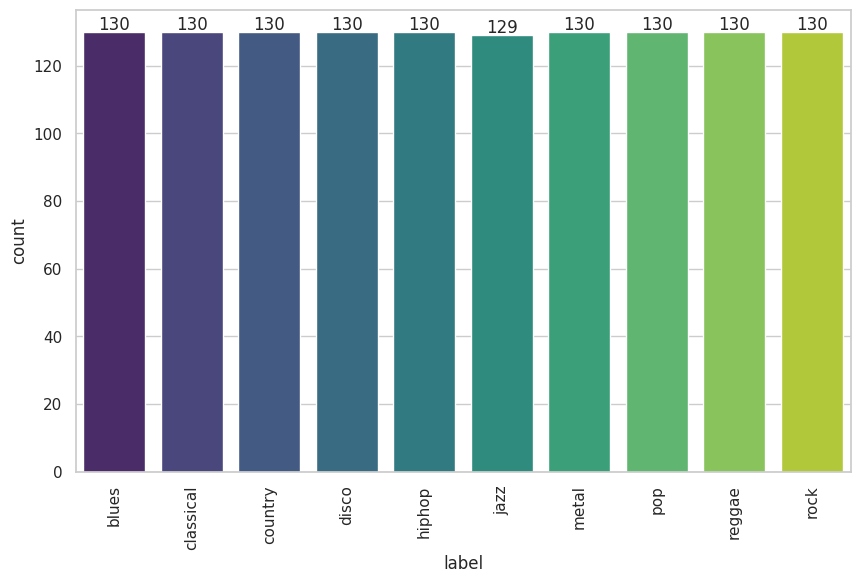

In [266]:
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='label', hue='label', data=df_ori_ytb_ready, palette='viridis', dodge=False)
plt.xticks(rotation=90)

for p in ax.patches:
    height = int(p.get_height())
    ax.annotate(f'{height}',
                xy=(p.get_x() + p.get_width() / 2., height),
                xytext=(0, 5),
                textcoords="offset points",
                ha='center', va='center')

plt.show()

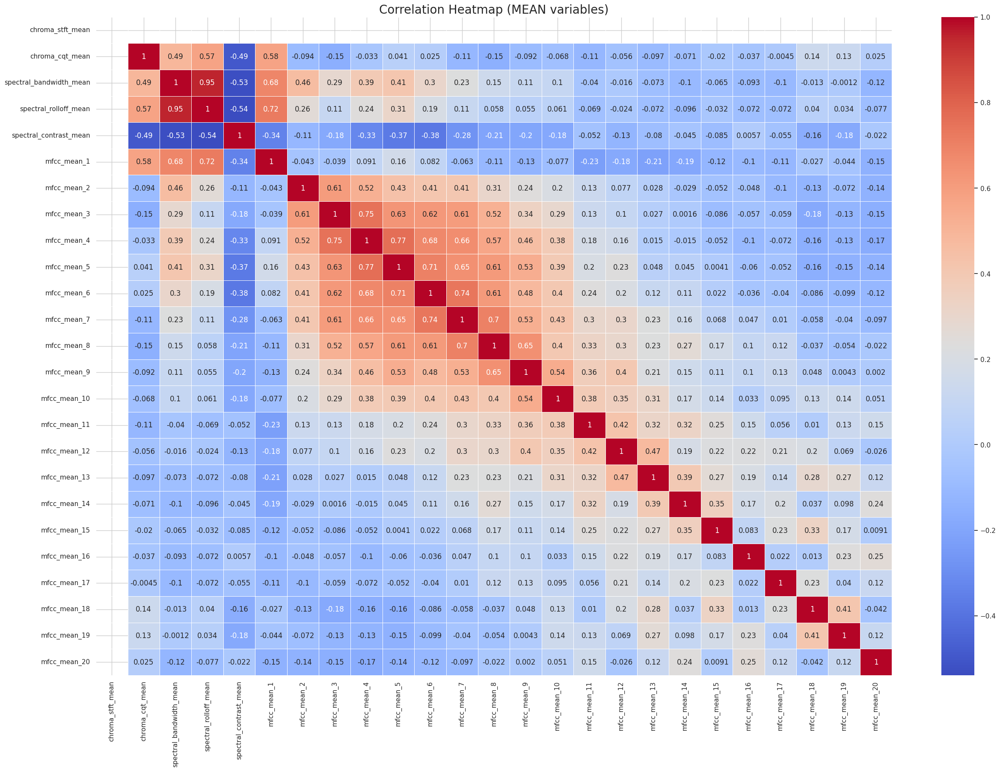

In [267]:
mean_cols = [col for col in df_ori_ytb_ready.columns if 'mean' in col]
corr = df_ori_ytb_ready[mean_cols].corr()


plt.figure(figsize=(30, 20))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap (MEAN variables)', fontsize = 20)
plt.show()

# Pre Processing Data

In [269]:
class_mapping = {
    "blues": 0,
    "classical": 1,
    "country": 2,
    "disco": 3,
    "hiphop": 4,
    "jazz": 5,
    "metal": 6,
    "pop": 7,
    "reggae": 8,
    "rock": 9,
}

df_ori_ytb_ready['label'] = df_ori_ytb_ready['label'].map(class_mapping)
df_ori_ytb_ready

,file_name,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20,label
0,blues.00000.wav,0.350129,0.00387,0.537825,0.053587,2002.412407,85834.410406,3805.723030,9.012529e+05,20.523289,76.801191,-113.598824,121.570671,-19.162262,42.363941,-6.362266,18.621931,-13.699734,15.339802,-12.274305,10.970944,-8.326061,8.802088,-3.669941,5.744675,-5.162783,0.751706,-1.687854,-0.408730,-2.302677,1.222467,-3.532875,-1.139781,-4.282828,-4.226084,0.915187,0.914064,-5.761807,-3.932804,1.509435,2.698465,5.656073,-3.269008,-0.206064,-2.999698,4.476317,-0.476855,6.006285,-0.059690,-3.458585,-1.841832,0
1,blues.00001.wav,0.350129,0.00387,0.476772,0.057725,2038.987608,213905.103191,3550.713616,2.978311e+06,20.672486,67.861845,-207.523834,123.985138,8.947019,35.867149,2.909595,21.519474,-8.556513,23.370676,-10.103608,11.899242,-5.558824,5.377876,-2.234492,4.220704,-6.010686,0.929294,-0.728403,0.296872,-0.282430,0.530644,-4.098784,-1.243186,-2.851357,-4.350195,3.275085,1.219573,-0.013766,-0.066608,3.979034,-0.457768,0.836019,-3.743217,-4.099705,-2.451905,5.834807,3.544988,4.897320,-0.415597,-1.995414,-0.465218,0
2,blues.00002.wav,0.350129,0.00387,0.443705,0.058773,1747.754087,76295.413398,3042.410115,7.841309e+05,22.191292,76.122598,-90.757164,140.440872,-29.084547,31.686693,-13.976547,25.753752,-13.664990,11.634442,-11.778322,9.714756,-13.125314,5.791247,-8.901966,-1.080160,-9.226244,2.448304,-7.724839,-1.819024,-3.440457,-2.238127,-4.052338,-0.571423,-2.011837,-5.386335,-5.133531,-7.805535,-1.168784,-0.205967,1.396435,-3.001880,-1.376481,-4.749632,-0.377516,0.493469,0.447271,-4.162672,-4.815749,-6.703234,-4.425334,-0.981519,0
3,blues.00003.wav,0.350129,0.00387,0.316891,0.071228,1596.422564,166551.844243,2184.879029,1.493078e+06,21.423621,63.386763,-199.575134,150.086105,5.663404,26.855282,1.770072,14.232647,-4.827846,9.286853,-0.756120,8.134435,-3.200026,6.078081,-2.478445,-1.081587,-2.874454,0.773994,-3.324069,0.636311,-0.615968,-3.405046,-1.496809,-0.054012,-1.861315,-4.709931,-3.926332,-6.649480,-2.897778,-3.225131,-0.272315,-3.817554,-2.821949,-4.204427,-2.702336,-3.845604,-2.524410,-4.935610,-5.954977,-6.616996,-6.396002,-1.501189,0
4,blues.00004.wav,0.350129,0.00387,0.497005,0.066045,1748.410758,88378.704478,3579.957471,1.572336e+06,21.459618,63.033892,-160.354172,126.209480,-35.581394,22.139256,-32.473549,10.850702,-23.350071,0.493249,-11.796538,1.203519,-13.084959,-2.810499,-6.934471,-7.553875,-9.167669,-4.515863,-5.451786,-0.915952,-4.408018,-11.704385,-5.866304,-0.721432,0.955714,-1.218466,4.580540,0.301649,-1.280044,-4.486533,-0.410622,0.279264,8.481701,3.646146,-3.007674,-6.110803,-6.951970,-4.070553,-1.137216,-0.491605,-4.786619,-3.221128,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1294,0029 jazz ytb.wav,0.350129,0.00387,0.412107,0.068361,1683.018818,135257.802886,1876.871984,7.429071e+05,22.957853,119.959384,-81.600174,156.619614,17.357782,31.567228,2.163747,7.400844,1.088501,-0.562433,-4.215766,6.521575,-1.879490,2.283730,-4.599555,-2.346450,0.172221,6.664866,0.585342,-0.063948,-7.343699,-0.241629,-2.298938,4.381245,-1.867655,0.748685,-6.433475,-2.818012,-3.054154,-0.083264,-4.181178,2.650867,5.279838,6.347916,-3.978682,-4.866354,-5.943622,-0.742138,-

In [270]:
df_ori_ytb_ready = df_ori_ytb_ready.drop(labels='file_name', axis=1)
df_ori_ytb_ready.head()

,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20,label
0,0.350129,0.00387,0.537825,0.053587,2002.412407,85834.410406,3805.723030,9.012529e+05,20.523289,76.801191,-113.598824,121.570671,-19.162262,42.363941,-6.362266,18.621931,-13.699734,15.339802,-12.274305,10.970944,-8.326061,8.802088,-3.669941,5.744675,-5.162783,0.751706,-1.687854,-0.408730,-2.302677,1.222467,-3.532875,-1.139781,-4.282828,-4.226084,0.915187,0.914064,-5.761807,-3.932804,1.509435,2.698465,5.656073,-3.269008,-0.206064,-2.999698,4.476317,-0.476855,6.006285,-0.059690,-3.458585,-1.841832,0
1,0.350129,0.00387,0.476772,0.057725,2038.987608,213905.103191,3550.713616,2.978311e+06,20.672486,67.861845,-207.523834,123.985138,8.947019,35.867149,2.909595,21.519474,-8.556513,23.370676,-10.103608,11.899242,-5.558824,5.377876,-2.234492,4.220704,-6.010686,0.929294,-0.728403,0.296872,-0.282430,0.530644,-4.098784,-1.243186,-2.851357,-4.350195,3.275085,1.219573,-0.013766,-0.066608,3.979034,-0.457768,0.836019,-3.743217,-4.099705,-2.451905,5.834807,3.544988,4.897320,-0.415597,-1.995414,-0.465218,0
2,0.350129,0.00387,0.443705,0.058773,1747.754087,76295.413398,3042.410115,7.841309e+05,22.191292,76.122598,-90.757164,140.440872,-29.084547,31.686693,-13.976547,25.753752,-13.664990,11.634442,-11.778322,9.714756,-13.125314,5.791247,-8.901966,-1.080160,-9.226244,2.448304,-7.724839,-1.819024,-3.440457,-2.238127,-4.052338,-0.571423,-2.011837,-5.386335,-5.133531,-7.805535,-1.168784,-0.205967,1.396435,-3.001880,-1.376481,-4.749632,-0.377516,0.493469,0.447271,-4.162672,-4.815749,-6.703234,-4.425334,-0.981519,0
3,0.350129,0.00387,0.316891,0.071228,1596.422564,166551.844243,2184.879029,1.493078e+06,21.423621,63.386763,-199.575134,150.086105,5.663404,26.855282,1.770072,14.232647,-4.827846,9.286853,-0.756120,8.134435,-3.200026,6.078081,-2.478445,-1.081587,-2.874454,0.773994,-3.324069,0.636311,-0.615968,-3.405046,-1.496809,-0.054012,-1.861315,-4.709931,-3.926332,-6.649480,-2.897778,-3.225131,-0.272315,-3.817554,-2.821949,-4.204427,-2.702336,-3.845604,-2.524410,-4.935610,-5.954977,-6.616996,-6.396002,-1.501189,0
4,0.350129,0.00387,0.497005,0.066045,1748.410758,88378.704478,3579.957471,1.572336e+06,21.459618,63.033892,-160.354172,126.209480,-35.581394,22.139256,-32.473549,10.850702,-23.350071,0.493249,-11.796538,1.203519,-13.084959,-2.810499,-6.934471,-7.553875,-9.167669,-4.515863,-5.451786,-0.915952,-4.408018,-11.704385,-5.866304,-0.721432,0.955714,-1.218466,4.580540,0.301649,-1.280044,-4.486533,-0.410622,0.279264,8.481701,3.646146,-3.007674,-6.110803,-6.951970,-4.070553,-1.137216,-0.491605,-4.786619,-3.221128,0


## Scaling Data

In [271]:
scaler = MinMaxScaler() # Scaling

data_scaled = scaler.fit_transform(df_ori_ytb_ready.drop(['label'], axis=1)) # Scaling Data
df_scaled = pd.DataFrame(data_scaled, columns=df_ori_ytb_ready.drop(['label'], axis=1).columns) # To Dataframe

df_scaled.head()

,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20
0,0.0,0.0,0.606172,0.389666,0.482407,0.081147,0.393954,0.102561,0.464241,0.323864,0.710823,0.583130,0.459829,0.614555,0.462745,0.639119,0.348325,0.544496,0.381466,0.593266,0.461357,0.635714,0.587021,0.614154,0.419633,0.587481,0.560641,0.422721,0.487947,0.599343,0.402572,0.459454,0.372594,0.505551,0.581536,0.592441,0.261700,0.370073,0.628464,0.592618,0.719184,0.308118,0.428889,0.396113,0.824928,0.550017,1.000000,0.571496,0.307911,0.395362
1,0.0,0.0,0.495174,0.451747,0.494967,0.220293,0.362233,0.342912,0.474093,0.280383,0.558588,0.594573,0.642642,0.549231,0.594560,0.678498,0.441431,0.653113,0.424219,0.616499,0.519255,0.548001,0.622327,0.571946,0.391533,0.593243,0.592676,0.448496,0.548787,0.579739,0.383830,0.456098,0.419582,0.501314,0.667266,0.601759,0.500342,0.506336,0.745918,0.464623,0.535698,0.292146,0.276498,0.421422,0.895555,0.810748,0.929064,0.553315,0.365156,0.455385
2,0.0,0.0,0.435056,0.467477,0.394956,0.070783,0.299003,0.089008,0.574387,0.320563,0.747845,0.672561,0.395297,0.507197,0.354494,0.736044,0.348954,0.494382,0.391235,0.561828,0.360944,0.558590,0.458335,0.425135,0.284969,0.642530,0.359072,0.371206,0.453682,0.501281,0.385368,0.477901,0.447139,0.465945,0.361798,0.326503,0.452389,0.501425,0.623089,0.361451,0.451474,0.258247,0.422179,0.557500,0.615460,0.311071,0.307758,0.232126,0.270088,0.432873
3,0.0,0.0,0.204502,0.654328,0.342988,0.168844,0.192332,0.171045,0.523694,0.258616,0.571472,0.718273,0.621287,0.458618,0.578360,0.579466,0.508929,0.462631,0.608321,0.522277,0.568608,0.565937,0.616327,0.425095,0.495468,0.588204,0.506009,0.460895,0.538742,0.468215,0.470002,0.494695,0.452080,0.489034,0.405653,0.361762,0.380606,0.395015,0.543724,0.328373,0.396449,0.276611,0.331189,0.357032,0.460964,0.260962,0.234886,0.236531,0.192987,0.410214
4,0.0,0.0,0.531958,0.576573,0.395182,0.083911,0.365871,0.180217,0.526071,0.256899,0.635042,0.605115,0.353044,0.411199,0.091528,0.533504,0.173628,0.343698,0.390876,0.348815,0.361788,0.338252,0.506727,0.245840,0.286911,0.416566,0.434967,0.404193,0.424544,0.233039,0.325294,0.473032,0.544549,0.608217,0.714690,0.573763,0.447770,0.350557,0.537146,0.494512,0.826748,0.541036,0.319239,0.252378,0.230778,0.317043,0.543059,0.549433,0.255953,0.335221


In [272]:
filename_scaler = 'scaler_FIXED.save'

joblib.dump(scaler, BASE_PATH + filename_scaler)

['/content/drive/MyDrive/CODE_FOR_LIFE/Deep Learning/music_classification/scaler_FIXED.save']

In [273]:
labels = df_ori_ytb_ready[['label']] # labels column
labels.sample(5)

,label
896,8
1049,0
116,1
152,1
18,0


In [274]:
df_ori_ytb_ready['label'].unique()

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

## Split Data

In [276]:
X = df_scaled.copy(deep=True) # Feature
y = df_ori_ytb_ready['label']

display(X)
display(y)

,chroma_stft_mean,chroma_stft_var,chroma_cqt_mean,chroma_cqt_var,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_contrast_mean,spectral_contrast_var,mfcc_mean_1,mfcc_var_1,mfcc_mean_2,mfcc_var_2,mfcc_mean_3,mfcc_var_3,mfcc_mean_4,mfcc_var_4,mfcc_mean_5,mfcc_var_5,mfcc_mean_6,mfcc_var_6,mfcc_mean_7,mfcc_var_7,mfcc_mean_8,mfcc_var_8,mfcc_mean_9,mfcc_var_9,mfcc_mean_10,mfcc_var_10,mfcc_mean_11,mfcc_var_11,mfcc_mean_12,mfcc_var_12,mfcc_mean_13,mfcc_var_13,mfcc_mean_14,mfcc_var_14,mfcc_mean_15,mfcc_var_15,mfcc_mean_16,mfcc_var_16,mfcc_mean_17,mfcc_var_17,mfcc_mean_18,mfcc_var_18,mfcc_mean_19,mfcc_var_19,mfcc_mean_20,mfcc_var_20
0,0.0,0.0,0.606172,0.389666,0.482407,0.081147,0.393954,0.102561,0.464241,0.323864,0.710823,0.583130,0.459829,0.614555,0.462745,0.639119,0.348325,0.544496,0.381466,0.593266,0.461357,0.635714,0.587021,0.614154,0.419633,0.587481,0.560641,0.422721,0.487947,0.599343,0.402572,0.459454,0.372594,0.505551,0.581536,0.592441,0.261700,0.370073,0.628464,0.592618,0.719184,0.308118,0.428889,0.396113,0.824928,0.550017,1.000000,0.571496,0.307911,0.395362
1,0.0,0.0,0.495174,0.451747,0.494967,0.220293,0.362233,0.342912,0.474093,0.280383,0.558588,0.594573,0.642642,0.549231,0.594560,0.678498,0.441431,0.653113,0.424219,0.616499,0.519255,0.548001,0.622327,0.571946,0.391533,0.593243,0.592676,0.448496,0.548787,0.579739,0.383830,0.456098,0.419582,0.501314,0.667266,0.601759,0.500342,0.506336,0.745918,0.464623,0.535698,0.292146,0.276498,0.421422,0.895555,0.810748,0.929064,0.553315,0.365156,0.455385
2,0.0,0.0,0.435056,0.467477,0.394956,0.070783,0.299003,0.089008,0.574387,0.320563,0.747845,0.672561,0.395297,0.507197,0.354494,0.736044,0.348954,0.494382,0.391235,0.561828,0.360944,0.558590,0.458335,0.425135,0.284969,0.642530,0.359072,0.371206,0.453682,0.501281,0.385368,0.477901,0.447139,0.465945,0.361798,0.326503,0.452389,0.501425,0.623089,0.361451,0.451474,0.258247,0.422179,0.557500,0.615460,0.311071,0.307758,0.232126,0.270088,0.432873
3,0.0,0.0,0.204502,0.654328,0.342988,0.168844,0.192332,0.171045,0.523694,0.258616,0.571472,0.718273,0.621287,0.458618,0.578360,0.579466,0.508929,0.462631,0.608321,0.522277,0.568608,0.565937,0.616327,0.425095,0.495468,0.588204,0.506009,0.460895,0.538742,0.468215,0.470002,0.494695,0.452080,0.489034,0.405653,0.361762,0.380606,0.395015,0.543724,0.328373,0.396449,0.276611,0.331189,0.357032,0.460964,0.260962,0.234886,0.236531,0.192987,0.410214
4,0.0,0.0,0.531958,0.576573,0.395182,0.083911,0.365871,0.180217,0.526071,0.256899,0.635042,0.605115,0.353044,0.411199,0.091528,0.533504,0.173628,0.343698,0.390876,0.348815,0.361788,0.338252,0.506727,0.245840,0.286911,0.416566,0.434967,0.404193,0.424544,0.233039,0.325294,0.473032,0.544549,0.608217,0.714690,0.573763,0.447770,0.350557,0.537146,0.494512,0.826748,0.541036,0.319239,0.252378,0.230778,0.317043,0.543059,0.549433,0.255953,0.335221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1294,0.0,0.0,0.377610,0.611319,0.372726,0.134844,0.154018,0.084237,0.625007,0.533786,0.762687,0.749237,0.697343,0.505996,0.583956,0.486618,0.616031,0.329420,0.540182,0.481911,0.596237,0.468743,0.564157,0.390064,0.596435,0.779344,0.636541,0.435316,0.336136,0.557855,0.443437,0.638650,0.451872,0.675367,0.314574,0.478617,0.374114,0.505749,0.357818,0.590688,0.704862,0.632037,0.281235,0.309872,0.283201,0.532819,0.543942,0.779240,0.316013,0.355310
1295,0.0,0.0,0.694459,0.359865,0.625532,0.161008,0.577265,0.112578,0.465807,0.779131,0.892656,0.433069,0.437347,0.448408,0.462482,0.590450,0.608964,0.447591,0.655846,0.511393,0.701292,0.521391,0.702274,0.477209,0.558226,0.643405,0.539273,0.524922,0.449798,0.533638,0.412327,0.477003,0.392045,0.644377,0.370006,0.519468,0.360277,0.494300,0.344240,0.526970,0.330243,0.350613,0.381347,0.464521,0.333289,0.627734,0.437656,0.459607,0.316870,0.466529
1296,0.0,0.0,0

0       0
1       0
2       0
3       0
4       0
       ..
1294    5
1295    6
1296    7
1297    8
1298    9
Name: label, Length: 1299, dtype: int64

In [311]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=0)

print("Baris data Latih: ", X_train.shape[0])
print("Kolom data Latih: ", X_train.shape[1])
print("Baris data Test: ", X_test.shape[0])
print("Kolom data Test: ", X_test.shape[1])

Baris data Latih:  1039
Kolom data Latih:  50
Baris data Test:  260
Kolom data Test:  50


# Machine Learning - Extremely Randomized Trees

In [312]:
model = ExtraTreesClassifier(n_estimators=100, random_state=42)

model.fit(X_train, y_train)

print("Training Success!")

Training Success!


In [313]:
joblib.dump(model, MODELS_PATH + 'extratrees_model_fixed.pkl')

print("Model saved!")

Model saved!


# Evaluate Models

In [314]:
class_names = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]

model_pred = model.predict(X_test)

print('Accuracy Score: ', accuracy_score(y_test, model_pred))
print(classification_report(y_test, model_pred, target_names= class_names))

Accuracy Score:  0.6115384615384616
              precision    recall  f1-score   support

       blues       0.79      0.58      0.67        26
   classical       0.82      0.88      0.85        26
     country       0.55      0.46      0.50        26
       disco       0.57      0.77      0.66        26
      hiphop       0.68      0.50      0.58        26
        jazz       0.61      0.65      0.63        26
       metal       0.71      0.77      0.74        26
         pop       0.56      0.54      0.55        26
      reggae       0.52      0.58      0.55        26
        rock       0.37      0.38      0.38        26

    accuracy                           0.61       260
   macro avg       0.62      0.61      0.61       260
weighted avg       0.62      0.61      0.61       260



<Axes: >

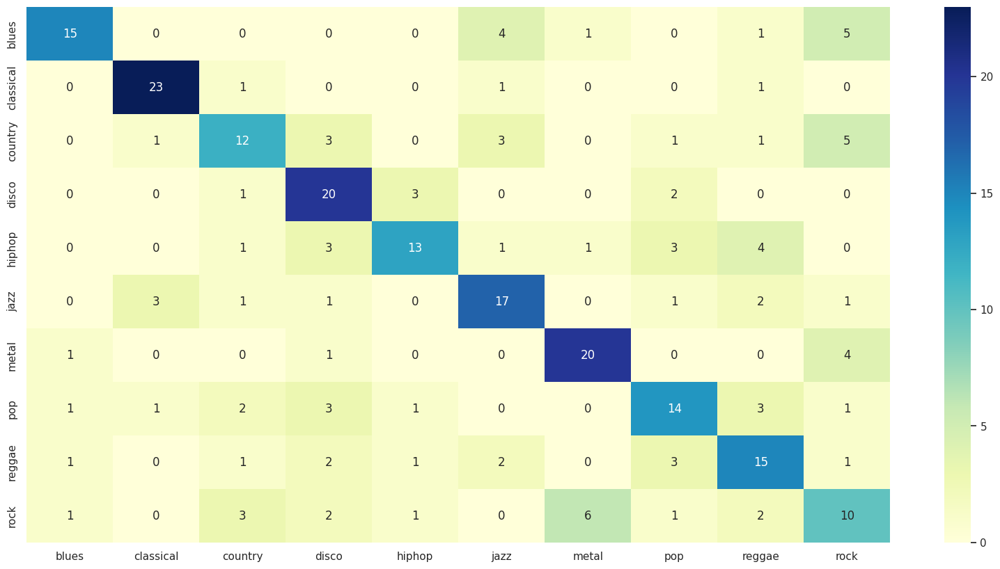

In [315]:
conf_mat = confusion_matrix(y_test, model_pred)
df_cm = pd.DataFrame(conf_mat, index = class_names, columns = class_names)
plt.figure(figsize = (20,10))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

# Predictive System

In [322]:
scaler = joblib.load(BASE_PATH + "scaler_FIXED.save") # Load Scaler
model = joblib.load(MODELS_PATH + 'extratrees_model_fixed.pkl') # Load Model

def predict_upload():
    uploaded = files.upload()
    for fn in uploaded.keys():
        testing_extracted = []
        path = fn

        mfccs, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var = extract_features(path)
        testing_extracted.append([mfccs, cs_mean, cs_var, ccqt_mean, ccqt_var, sb_mean, sb_var, spr_mean, spr_var, sc_mean, sc_var])

        df_test = pd.DataFrame(testing_extracted,
                               columns=['mfccs',
                                        'chroma_stft_mean',
                                        'chroma_stft_var',
                                        'chroma_cqt_mean',
                                        'chroma_cqt_var',
                                        'spectral_bandwidth_mean',
                                        'spectral_bandwidth_var',
                                        'spectral_rolloff_mean',
                                        'spectral_rolloff_var',
                                        'spectral_contrast_mean',
                                        'spectral_contrast_var'])

        split_mfccs_columns(df_test)
        df_test = df_test.drop('mfccs', axis=1)

        reshaped_data = np.array(df_test)
        features_scaled = scaler.transform(reshaped_data)
        prediction = model.predict(features_scaled)

    display(IPython.display.Audio(path, rate = sampling_rate))

    if (prediction == 0):
            result = print("blues")
    elif (prediction == 1):
            result = print("classical")
    elif (prediction == 2):
            result = print("country")
    elif (prediction == 3):
            result = print("disco")
    elif (prediction == 4):
            result = print("hiphop")
    elif (prediction == 5):
            result = print("jazz")
    elif (prediction == 6):
            result = print("metal")
    elif (prediction == 7):
            result = print("pop")
    elif (prediction == 8):
            result = print("reggae")
    else:
        result = print("rock")

    return result

In [319]:
predict_upload()

Output hidden; open in https://colab.research.google.com to view.

In [324]:
predict_upload()

Saving country.00057.wav to country.00057.wav


country


In [325]:
predict_upload()

Saving classical.00002.wav to classical.00002.wav


classical


In [326]:
predict_upload()

Saving disco.00008.wav to disco.00008.wav


disco


In [327]:
predict_upload()

Saving hiphop.00008.wav to hiphop.00008.wav


hiphop


In [328]:
predict_upload()

Saving jazz.00006.wav to jazz.00006.wav


jazz


In [329]:
predict_upload()

Saving metal.00007.wav to metal.00007.wav


metal


In [330]:
predict_upload()

Saving pop.00013.wav to pop.00013.wav


pop


In [331]:
predict_upload()

Saving reggae.00013.wav to reggae.00013.wav


reggae


In [332]:
predict_upload()

Saving rock.00009.wav to rock.00009.wav


rock
